<a href="https://colab.research.google.com/github/Bikash1710/JPMCAIMLBatch1Group1CapSt/blob/main/Capstone_Proj_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# IMPORT DATA
import pandas as pd
import numpy as np

data = pd.read_excel('/content/drive/My Drive/data/input_data.xlsx')

data.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [3]:
data.rename(columns={"Short description":"Short_description","Assignment group":"Assignment_group"},inplace=True)
data.head()

,Short_description,Description,Caller,Assignment_group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [4]:
def cleanse(text):
      text0=str(text)
      text1=text0.replace('_x000D_',' ')
      text2=text1.replace('@gmail.com',' ')
      text3=text2.replace('.',' ')
      text4=text3.replace('@company.com',' ')
      return text4

In [5]:
data['Description']=data['Description'].apply(cleanse)

In [6]:
data.head()

,Short_description,Description,Caller,Assignment_group
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [7]:
print(data.Assignment_group.value_counts())

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
          ... 
GRP_64       1
GRP_67       1
GRP_35       1
GRP_70       1
GRP_73       1
Name: Assignment_group, Length: 74, dtype: int64


In [8]:
pip install langdetect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 981 kB 5.2 MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=c4f7655a53c7616049b57c13cf3cb66b512f900a353b70f17c0c71bcdc33a786
  Stored in directory: /root/.cache/pip/wheels/c5/96/8a/f90c59ed25d75e50a8c10a1b1c2d4c402e4dacfa87f3aff36a
Successfully built langdetect


In [9]:
from langdetect import detect

In [10]:
Row_list =[]
  
for index, rows in data.iterrows():
    my_list =str(rows.Short_description) +" " + str(rows.Description)
    Row_list.append(my_list)

In [11]:
se = pd.Series(Row_list)
data['All_description'] = se.values

In [12]:
data.head()

,Short_description,Description,Caller,Assignment_group,All_description
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error


In [13]:
Row_list =[]

for index, rows in data.iterrows():
    try:
        language = detect(rows.All_description)
    except:
        language = "error"
    Row_list.append(language)

In [14]:
se = pd.Series(Row_list)
data['lang'] = se.values

In [15]:
data.head()

,Short_description,Description,Caller,Assignment_group,All_description,lang
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...,en
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...,en
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...,en
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no


In [16]:

print(data.lang.value_counts())

en    7080
de     384
af     270
it     128
fr     118
sv      77
nl      76
no      72
da      68
es      47
ca      44
pl      32
pt      25
tl      11
cy      10
ro       9
sq       8
et       7
hr       6
sl       5
id       5
fi       5
tr       5
lt       3
sk       2
so       2
cs       1
Name: lang, dtype: int64


In [17]:
pd.crosstab(index=data['lang'], columns=data['Assignment_group'])

Assignment_group,GRP_0,GRP_1,GRP_10,GRP_11,GRP_12,GRP_13,GRP_14,GRP_15,GRP_16,GRP_17,...,GRP_67,GRP_68,GRP_69,GRP_7,GRP_70,GRP_71,GRP_72,GRP_73,GRP_8,GRP_9
lang,,,,,,,,,,,,,,,,,,,,,
af,241,0,0,0,1,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0
ca,19,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
cs,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
cy,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
da,17,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
de,108,0,3,1,25,2,2,0,1,0,...,0,0,0,0,0,0,0,0,0,0
en,3181,28,136,29,224,140,113,37,83,76,...,1,3,2,68,1,2,2,1,658,250
es,36,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
et,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
data2=data[data['lang']=='de'][['Short_description','Description']]


In [19]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
data2=data[data['lang']=='af'][['Short_description','Description']]

In [21]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
data2=data[data['lang']=='it'][['Short_description','Description']]

In [23]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [21]:
data2=data[data['lang']=='fr'][['Short_description','Description']]

In [25]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
data2=data[data['lang']=='no'][['Short_description','Description']]

In [27]:
from google.colab import files

data2.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [23]:
data_eng=data[data['lang']!='de']

In [25]:
name_list=data['Caller'].str.split().to_list()
print(name_list)

[['spxjnwir', 'pjlcoqds'], ['hmjdrvpb', 'komuaywn'], ['eylqgodm', 'ybqkwiam'], ['xbkucsvz', 'gcpydteq'], ['owlgqjme', 'qhcozdfx'], ['eflahbxn', 'ltdgrvkz'], ['jyoqwxhz', 'clhxsoqy'], ['eqzibjhw', 'ymebpoih'], ['mdbegvct', 'dbvichlg'], ['fumkcsji', 'sarmtlhy'], ['badgknqs', 'xwelumfz'], ['dcqsolkx', 'kmsijcuz'], ['oblekmrw', 'qltgvspb'], ['iftldbmu', 'fujslwby'], ['epwyvjsz', 'najukwho'], ['fumkcsji', 'sarmtlhy'], ['chobktqj', 'qdamxfuc'], ['sigfdwcj', 'reofwzlm'], ['nqdyowsm', 'yqerwtna'], ['ftsqkvre', 'bqzrupic'], ['mrzgjdal', 'whnldmef'], ['ugephfta', 'hrbqkvij'], ['pfmcnahv', 'ofzlusri'], ['fumkcsji', 'sarmtlhy'], ['dceoufyz', 'saufqkmd'], ['jqhtkfsm', 'xoehtbnl'], ['dtisfuyp', 'fpvrjlkz'], ['lduqxywt', 'wcydjgvl'], ['mwebfhdz', 'csndrxgi'], ['hvskpglx', 'bpsfxmon'], ['wrlzneit', 'ayqutwgh'], ['qcehailo', 'wqynckxg'], ['kxsceyzo', 'naokumlb'], ['fsqwkbez', 'eudsantq'], ['xzbhmfpg', 'bhqxesym'], ['eqzibjhw', 'ymebpoih'], ['ztlvkmyi', 'xldyitwz'], ['shloyakw', 'jztsxdln'], ['qcxivzag'

In [26]:
import itertools
names_all=list(itertools.chain.from_iterable(list(name_list)))


In [27]:
import nltk
from string import punctuation
from nltk.corpus import stopwords
from nltk import word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
stop_words = stopwords.words('english') + list(punctuation)+names_all
 
def tokenize(text):
    words = word_tokenize(text)
    words = [w.lower() for w in words]
    return ' '.join([w for w in words if w not in stop_words and not w.isdigit()])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [28]:
data_eng['Short_description1']=data_eng['Short_description'].apply(str)
data_eng['Short_description1']=data_eng['Short_description1'].apply(tokenize)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [29]:
data_eng.head()

,Short_description,Description,Caller,Assignment_group,All_description,lang,Short_description1
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...,en,login issue
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...,en,outlook
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...,en,cant log vpn
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en,unable access hr_tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no,skype error


In [30]:
data_eng['Description1']=data_eng['Description'].apply(str)
data_eng['Description1']=data_eng['Description1'].apply(tokenize)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [31]:
data_eng.head()

,Short_description,Description,Caller,Assignment_group,All_description,lang,Short_description1,Description1
0,login issue,-verified user details (employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details (employee# ...,en,login issue,-verified user details employee manager name -...
1,outlook,\n \nreceived from: hmjdrvpb komuaywn \n \nh...,hmjdrvpb komuaywn,GRP_0,outlook \n \nreceived from: hmjdrvpb komuaywn...,en,outlook,received hello team meetings/skype meetings et...
2,cant log in to vpn,\n \nreceived from: eylqgodm ybqkwiam \n \nh...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n \nreceived from: eylqgo...,en,cant log vpn,received hi log vpn best
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en,unable access hr_tool page,unable access hr_tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no,skype error,skype error


In [32]:
dev_data=data_eng.drop(['Short_description','Description','Caller','All_description'],axis=1)
dev_data.head()

,Assignment_group,lang,Short_description1,Description1
0,GRP_0,en,login issue,-verified user details employee manager name -...
1,GRP_0,en,outlook,received hello team meetings/skype meetings et...
2,GRP_0,en,cant log vpn,received hi log vpn best
3,GRP_0,en,unable access hr_tool page,unable access hr_tool page
4,GRP_0,no,skype error,skype error


In [33]:
dev_data.shape

(8116, 4)

In [34]:
word_list=dev_data['Short_description1'].str.split().to_list()

In [35]:
import itertools
words_all=list(itertools.chain.from_iterable(word_list))
print(len(words_all))

40783


In [36]:
words_all_dedup=list(set(words_all))
print(len(words_all_dedup))

7765


In [37]:
word_list=dev_data['Description1'].str.split().to_list()
import itertools
words_all=list(itertools.chain.from_iterable(word_list))
print(len(words_all))
words_all_dedup=list(set(words_all))
print(len(words_all_dedup))
print(words_all_dedup)

151561
18665
['listing', 'ef21', 'kd05', 'speculation', 'kick', 'å‡ºè´§å\x8d•çš', 'lunjuws', 'foreseedstipgeo', 'sebfghkasthian', 'com/irj/portal', '111/445', 'plant_76', 'probably', '117/445', 'bhergtyemm', '3pm', 'context', 'wusdajqv', 'relationship', '__________12:35', 'ÿçš', 'ticket_no1475338', 'rickjdt', 'matheywter', 'unrestricted', 'included', '_____yes____', '08/08/2016-18:49:36', 'â£367', 'd562', '17:32:28', '4g', 'è§£å†³', 'sdtoezjb', 'itemization', 'inplant_874743', 'set-coo', 'inwarehouse_tool', 'no-200535', '_______1:29pm', '7/5/2016', '09:30:00', '13:21:00', '3095/57076', 'othyoiz', '¶åˆ°æœ¬è®¯æ\x81¯ï¼œè¯·é€šçÿ¥å\x8f', 'atjsv001', 'job_1379', 'bqxcdfiz', '02617:3720', 'wrote', 'job_1953', 'exchange', 'scanner/printer', 'owned', '2ff23140', 'update', 'ethernet', 'enviroment', '15+', 'faxing', '6:44', 'bfbfc520', '01sid_35ef9', 'scanned', 'denies', 'freezes', 'dotm', '6799:58:00', 'validate', 'sotmfcga', 'inc1559962', 'accessed', 'spindle', 'szewiguc', 'choose', 'cloud', 'b

In [42]:
from google.colab import files

dev_data.to_csv('data_clean_v1.csv', encoding = 'utf-8-sig') 
files.download('data_clean_v1.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

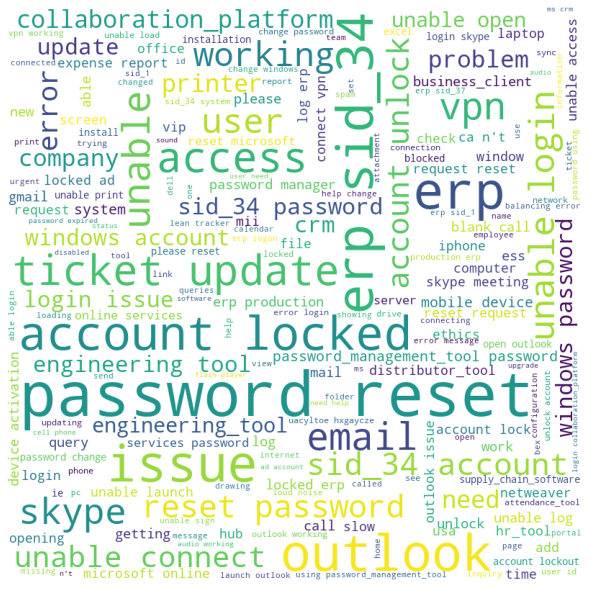

In [57]:

# importing all necessary modules
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

def word_cl(grp):
    global freq_data
    desc_words = ''
    stopwords = set(STOPWORDS)
    data_in=dev_data[dev_data['Assignment_group']==grp]


    # iterate through the csv file
    for val in data_in.Short_description1:
        # typecaste each val to string
        val = str(val)
    
        # split the value
        tokens = val.split()
        
        # Converts each token into lowercase
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()
        
        desc_words += " ".join(tokens)+" "
    
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(desc_words)

    text_dictionary = wordcloud.process_text(desc_words)
    word_freq={k: v for k, v in sorted(text_dictionary.items(),reverse=True, key=lambda item: item[1])}
    rel_freq=wordcloud.words_
    freq_data1=pd.DataFrame(word_freq.items(), columns=['Words', 'Freq'])
    freq_data2=pd.DataFrame(rel_freq.items(), columns=['Words', 'Freq_Pct'])
    freq_data=pd.merge(freq_data1, freq_data2, on='Words')
    freq_data['Group']=grp
    # plot the WordCloud image                      
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    
    plt.show()

word_cl('GRP_0')

In [58]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,password reset,343,1.000000,GRP_0
1,erp,232,0.676385,GRP_0
2,issue,228,0.664723,GRP_0
3,outlook,225,0.655977,GRP_0
4,erp sid_34,225,0.655977,GRP_0
5,account locked,192,0.559767,GRP_0
6,ticket update,151,0.440233,GRP_0
7,access,150,0.437318,GRP_0
8,unable,125,0.364431,GRP_0
9,vpn,120,0.349854,GRP_0


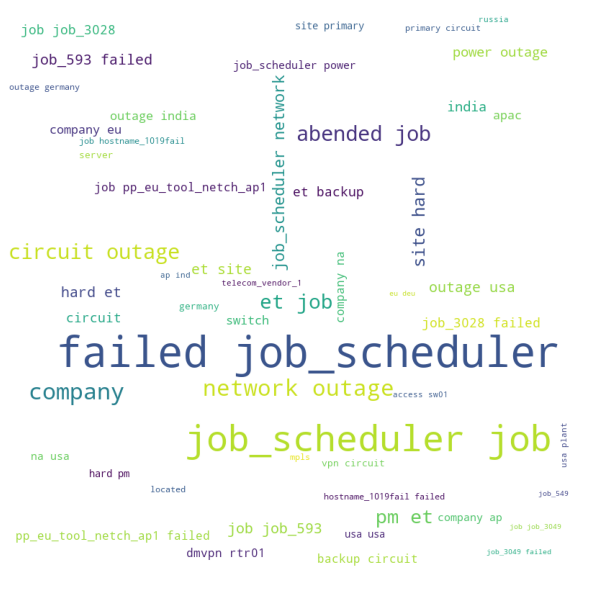

In [59]:
word_cl('GRP_8')

In [60]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,failed job_scheduler,362,1.000000,GRP_8
1,job_scheduler job,249,0.687845,GRP_8
2,company,71,0.196133,GRP_8
3,network outage,65,0.179558,GRP_8
4,circuit outage,55,0.151934,GRP_8
5,abended job,54,0.149171,GRP_8
6,et job,51,0.140884,GRP_8
7,pm et,48,0.132597,GRP_8
8,site hard,36,0.099448,GRP_8
9,job_scheduler network,31,0.085635,GRP_8


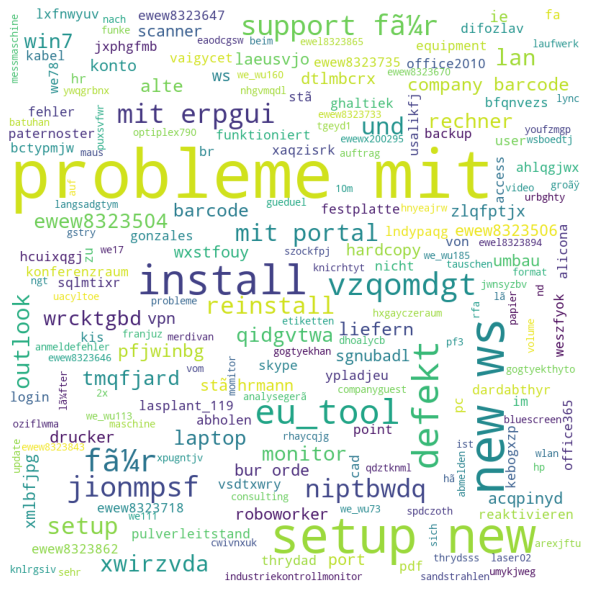

In [61]:
word_cl('GRP_24')

In [62]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,probleme mit,65,1.000000,GRP_24
1,setup new,32,0.492308,GRP_24
2,new ws,32,0.492308,GRP_24
3,install,21,0.323077,GRP_24
4,defekt,16,0.246154,GRP_24
5,eu_tool,15,0.230769,GRP_24
6,fã¼r,12,0.184615,GRP_24
7,vzqomdgt,12,0.184615,GRP_24
8,jionmpsf,10,0.153846,GRP_24
9,support fã¼r,10,0.153846,GRP_24


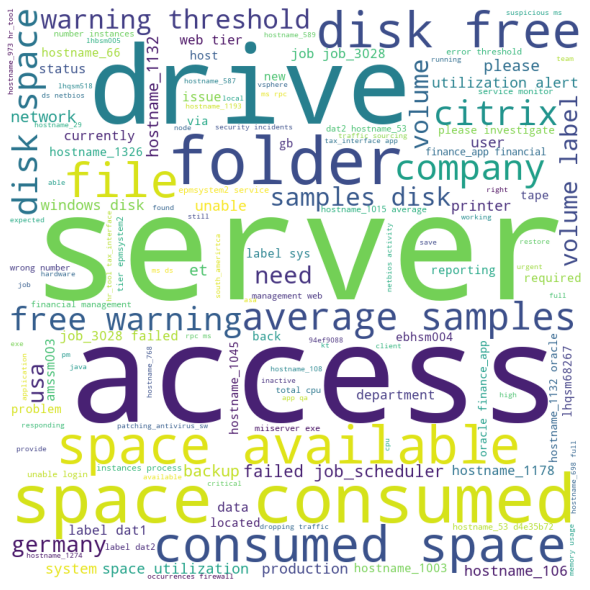

In [63]:
word_cl('GRP_12')

In [65]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,server,49,1.000000,GRP_12
1,access,40,0.816327,GRP_12
2,drive,23,0.469388,GRP_12
3,space consumed,18,0.367347,GRP_12
4,folder,17,0.346939,GRP_12
5,space available,17,0.346939,GRP_12
6,consumed space,15,0.306122,GRP_12
7,disk free,15,0.306122,GRP_12
8,file,14,0.285714,GRP_12
9,average samples,13,0.265306,GRP_12


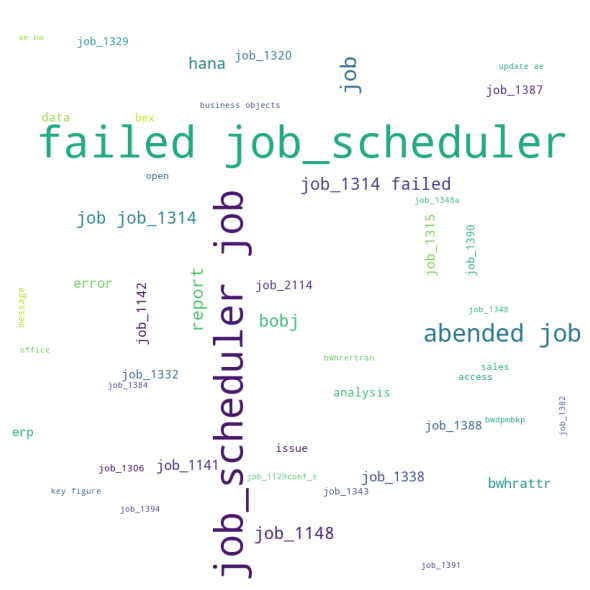

In [66]:
word_cl('GRP_9')

In [67]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,failed job_scheduler,153,1.000000,GRP_9
1,job_scheduler job,118,0.771242,GRP_9
2,abended job,31,0.202614,GRP_9
3,job,23,0.150327,GRP_9
4,report,15,0.098039,GRP_9
5,bobj,13,0.084967,GRP_9
6,job_1148,13,0.084967,GRP_9
7,job job_1314,13,0.084967,GRP_9
8,job_1314 failed,13,0.084967,GRP_9
9,hana,12,0.078431,GRP_9


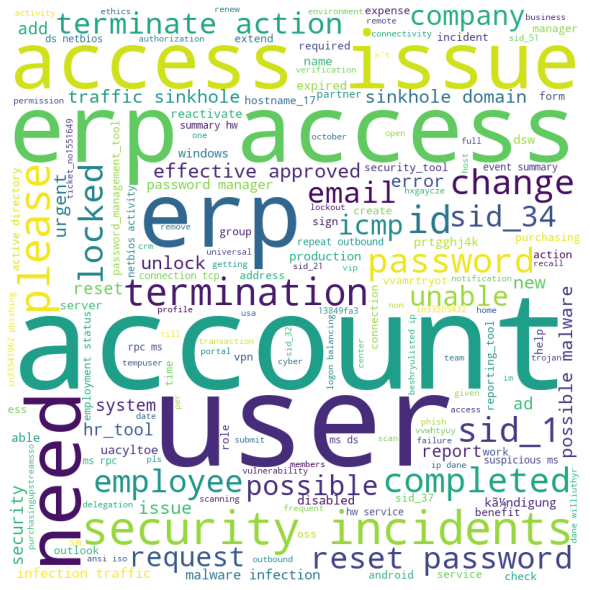

In [68]:
word_cl('GRP_2')

In [69]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,account,32,1.00000,GRP_2
1,user,30,0.93750,GRP_2
2,erp access,29,0.90625,GRP_2
3,erp,27,0.84375,GRP_2
4,access issue,26,0.81250,GRP_2
5,need,23,0.71875,GRP_2
6,security incidents,20,0.62500,GRP_2
7,please,17,0.53125,GRP_2
8,id,13,0.40625,GRP_2
9,termination,13,0.40625,GRP_2


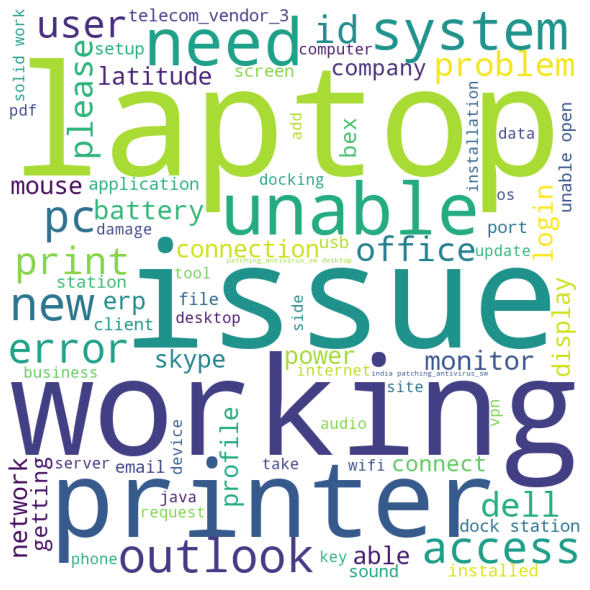

In [70]:
word_cl('GRP_19')

In [71]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,laptop,32,1.00000,GRP_19
1,issue,29,0.90625,GRP_19
2,working,28,0.87500,GRP_19
3,printer,17,0.53125,GRP_19
4,unable,16,0.50000,GRP_19
5,need,13,0.40625,GRP_19
6,system,9,0.28125,GRP_19
7,outlook,9,0.28125,GRP_19
8,new,9,0.28125,GRP_19
9,pc,8,0.25000,GRP_19


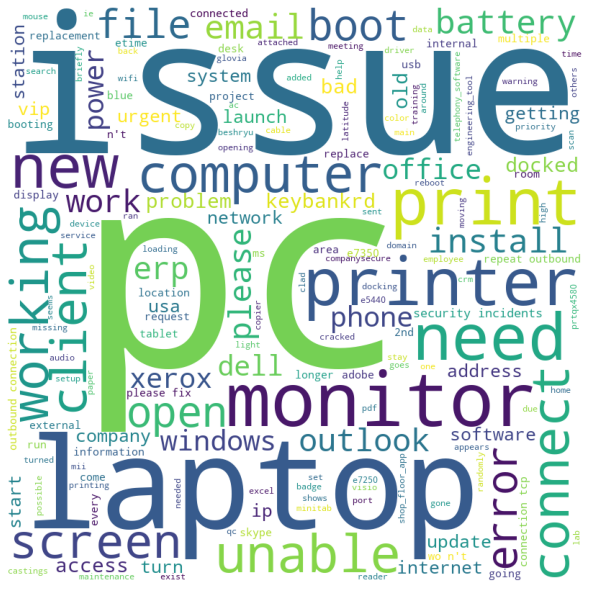

In [72]:
word_cl('GRP_3')

In [73]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,pc,28,1.000000,GRP_3
1,issue,24,0.857143,GRP_3
2,laptop,21,0.750000,GRP_3
3,monitor,20,0.714286,GRP_3
4,printer,16,0.571429,GRP_3
5,print,15,0.535714,GRP_3
6,need,15,0.535714,GRP_3
7,new,13,0.464286,GRP_3
8,computer,12,0.428571,GRP_3
9,unable,12,0.428571,GRP_3


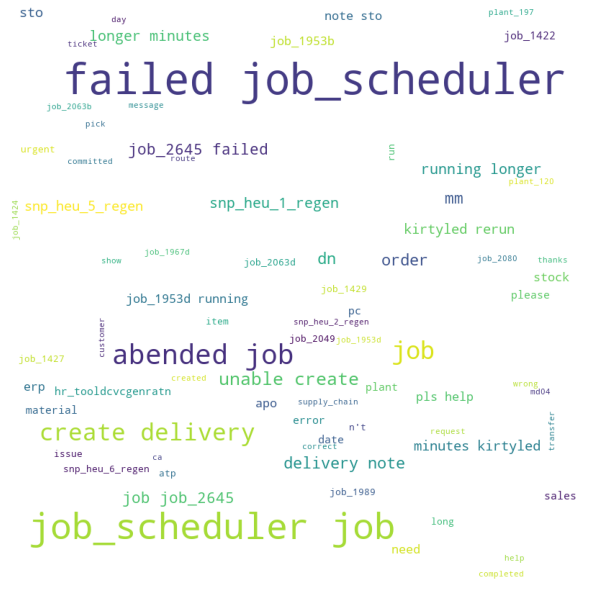

In [74]:
word_cl('GRP_6')

In [75]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,failed job_scheduler,85,1.000000,GRP_6
1,job_scheduler job,58,0.682353,GRP_6
2,abended job,31,0.364706,GRP_6
3,job,25,0.294118,GRP_6
4,create delivery,23,0.270588,GRP_6
5,unable create,12,0.141176,GRP_6
6,dn,9,0.105882,GRP_6
7,order,9,0.105882,GRP_6
8,delivery note,9,0.105882,GRP_6
9,mm,8,0.094118,GRP_6


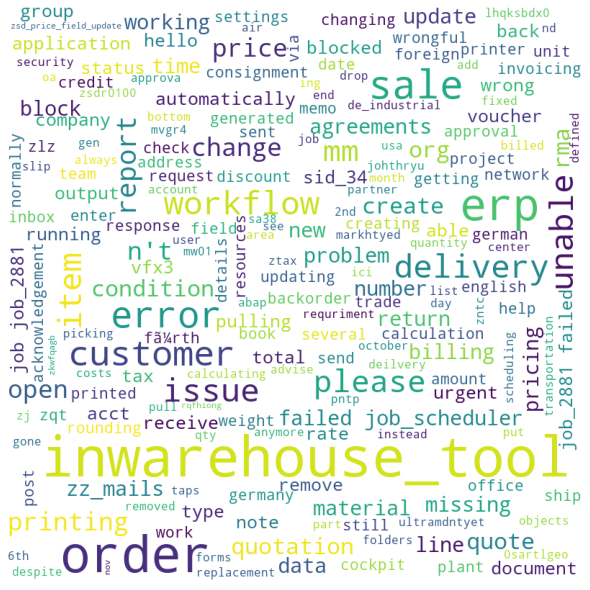

In [76]:
word_cl('GRP_13')

In [77]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,inwarehouse_tool,31,1.000000,GRP_13
1,order,25,0.806452,GRP_13
2,erp,19,0.612903,GRP_13
3,sale,15,0.483871,GRP_13
4,error,13,0.419355,GRP_13
5,customer,12,0.387097,GRP_13
6,workflow,10,0.322581,GRP_13
7,item,10,0.322581,GRP_13
8,delivery,10,0.322581,GRP_13
9,unable,10,0.322581,GRP_13


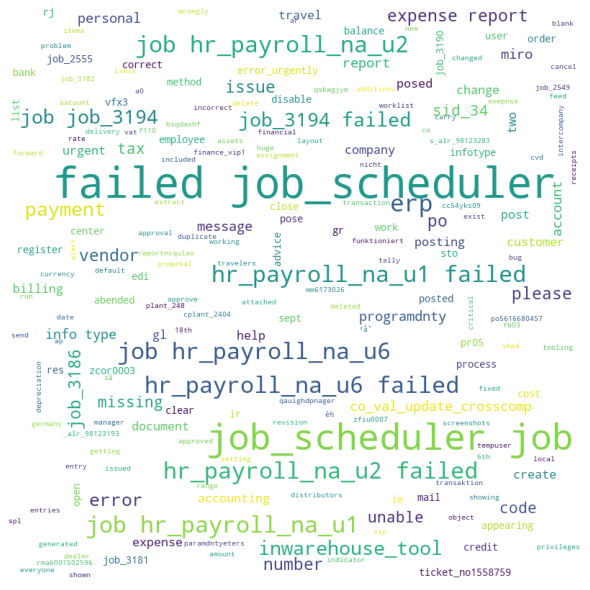

In [78]:
word_cl('GRP_10')

In [79]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,failed job_scheduler,61,1.000000,GRP_10
1,job_scheduler job,42,0.688525,GRP_10
2,erp,13,0.213115,GRP_10
3,job hr_payroll_na_u1,12,0.196721,GRP_10
4,hr_payroll_na_u1 failed,12,0.196721,GRP_10
5,job hr_payroll_na_u2,12,0.196721,GRP_10
6,hr_payroll_na_u2 failed,12,0.196721,GRP_10
7,job hr_payroll_na_u6,12,0.196721,GRP_10
8,hr_payroll_na_u6 failed,12,0.196721,GRP_10
9,payment,8,0.131148,GRP_10


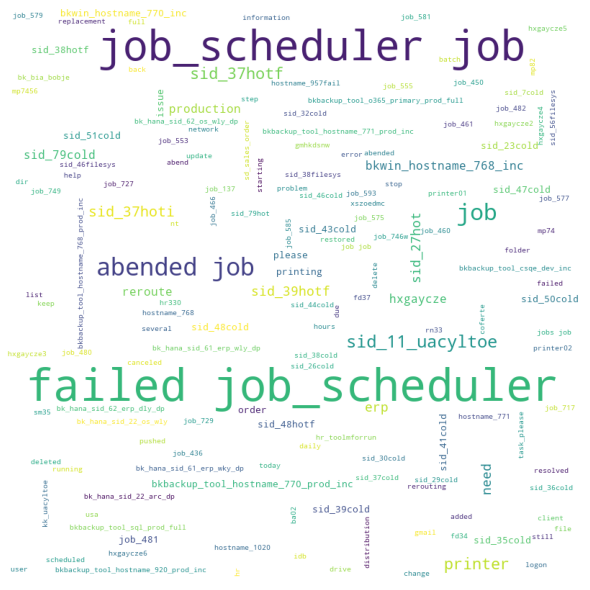

In [80]:
word_cl('GRP_5')

In [81]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,failed job_scheduler,96,1.000000,GRP_5
1,job_scheduler job,85,0.885417,GRP_5
2,abended job,16,0.166667,GRP_5
3,job,14,0.145833,GRP_5
4,sid_11_uacyltoe,7,0.072917,GRP_5
5,sid_37hotf,6,0.062500,GRP_5
6,printer,6,0.062500,GRP_5
7,sid_37hoti,5,0.052083,GRP_5
8,need,4,0.041667,GRP_5
9,erp,4,0.041667,GRP_5


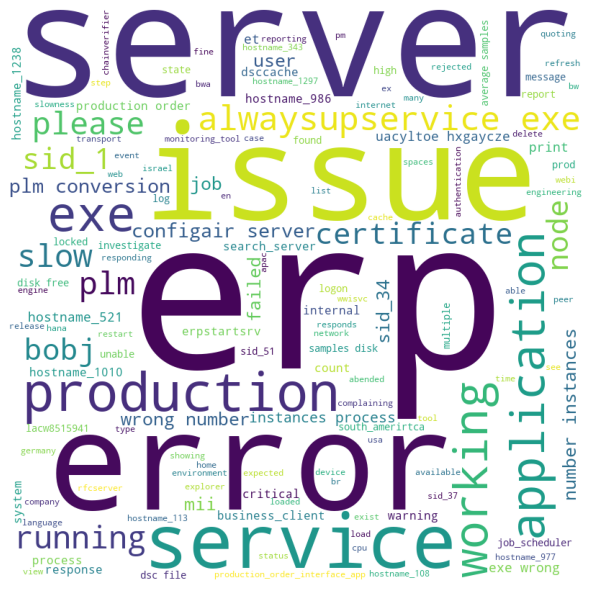

In [82]:
word_cl('GRP_14')

In [83]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,erp,29,1.000000,GRP_14
1,server,22,0.758621,GRP_14
2,error,16,0.551724,GRP_14
3,issue,15,0.517241,GRP_14
4,service,14,0.482759,GRP_14
5,production,12,0.413793,GRP_14
6,exe,10,0.344828,GRP_14
7,application,9,0.310345,GRP_14
8,working,9,0.310345,GRP_14
9,alwaysupservice exe,9,0.310345,GRP_14


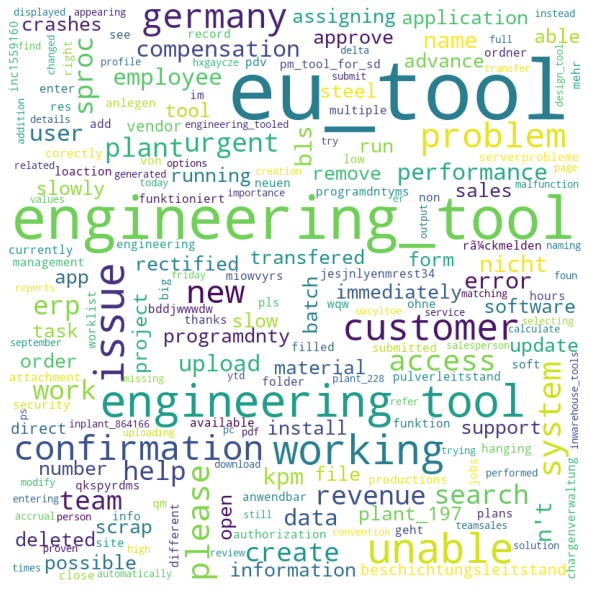

In [84]:
word_cl('GRP_25')

In [85]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,eu_tool,30,1.000000,GRP_25
1,engineering_tool,23,0.766667,GRP_25
2,engineering tool,12,0.400000,GRP_25
3,issue,10,0.333333,GRP_25
4,working,10,0.333333,GRP_25
5,unable,10,0.333333,GRP_25
6,customer,8,0.266667,GRP_25
7,germany,7,0.233333,GRP_25
8,problem,7,0.233333,GRP_25
9,confirmation,7,0.233333,GRP_25


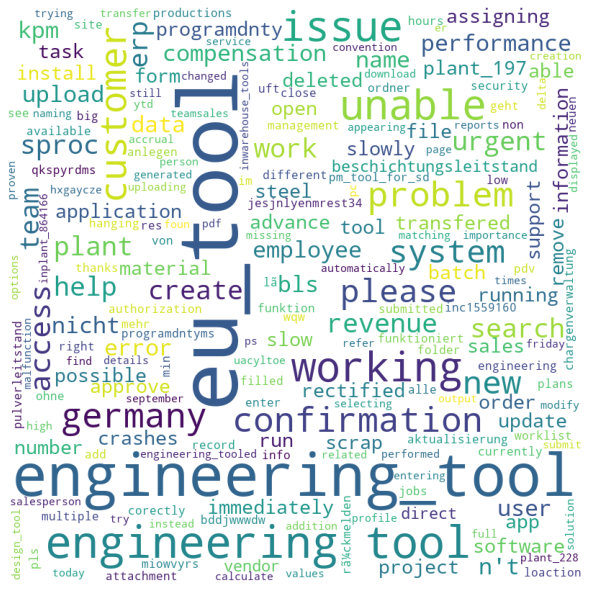

In [57]:
word_cl('GRP_25')

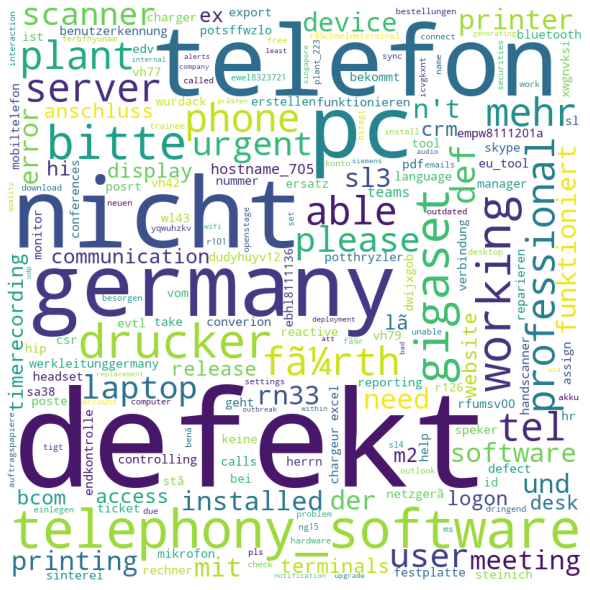

In [86]:
word_cl('GRP_33')

In [87]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,defekt,11,1.000000,GRP_33
1,telefon,5,0.454545,GRP_33
2,nicht,5,0.454545,GRP_33
3,germany,4,0.363636,GRP_33
4,pc,4,0.363636,GRP_33
5,telephony_software,4,0.363636,GRP_33
6,gigaset,3,0.272727,GRP_33
7,bitte,3,0.272727,GRP_33
8,drucker,3,0.272727,GRP_33
9,working,3,0.272727,GRP_33


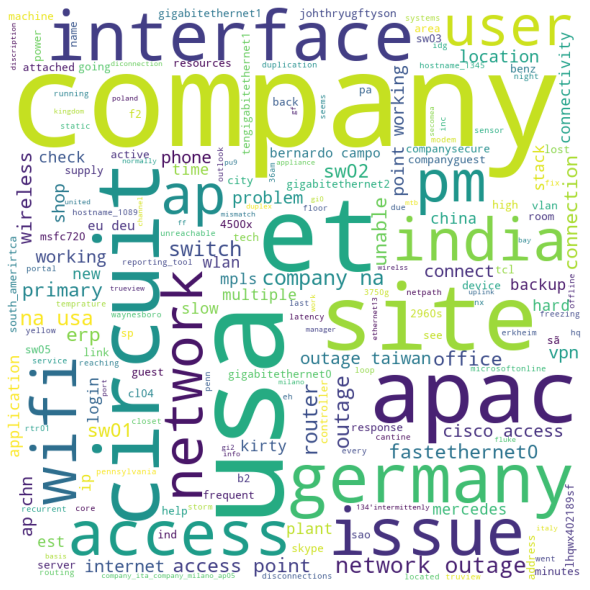

In [88]:
word_cl('GRP_4')

In [89]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,company,29,1.000000,GRP_4
1,usa,26,0.896552,GRP_4
2,et,17,0.586207,GRP_4
3,site,13,0.448276,GRP_4
4,circuit,12,0.413793,GRP_4
5,apac,12,0.413793,GRP_4
6,interface,11,0.379310,GRP_4
7,germany,11,0.379310,GRP_4
8,issue,10,0.344828,GRP_4
9,access,9,0.310345,GRP_4


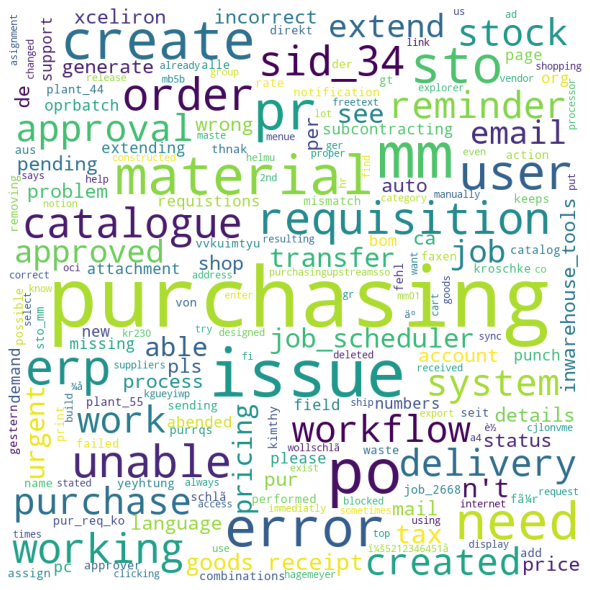

In [90]:
word_cl('GRP_29')

In [91]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,purchasing,24,1.000000,GRP_29
1,issue,14,0.583333,GRP_29
2,mm,13,0.541667,GRP_29
3,po,12,0.500000,GRP_29
4,create,9,0.375000,GRP_29
5,pr,9,0.375000,GRP_29
6,error,9,0.375000,GRP_29
7,material,9,0.375000,GRP_29
8,need,8,0.333333,GRP_29
9,sto,8,0.333333,GRP_29


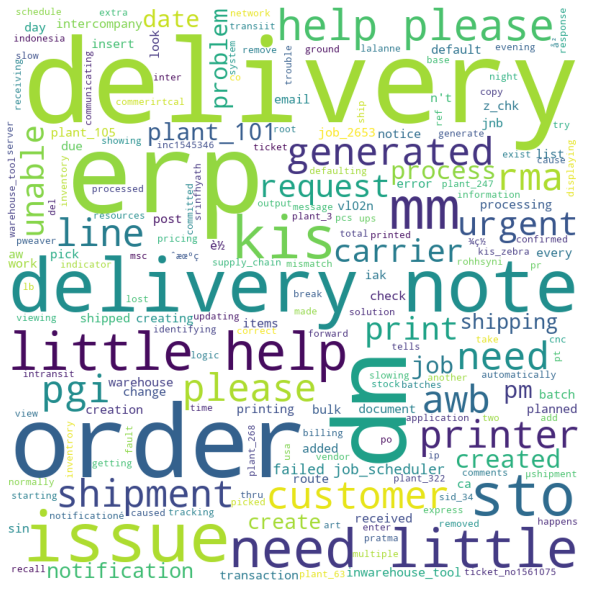

In [92]:
word_cl('GRP_18')

In [93]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,delivery,11,1.000000,GRP_18
1,erp,10,0.909091,GRP_18
2,dn,8,0.727273,GRP_18
3,order,8,0.727273,GRP_18
4,delivery note,8,0.727273,GRP_18
5,issue,7,0.636364,GRP_18
6,mm,5,0.454545,GRP_18
7,sto,5,0.454545,GRP_18
8,kis,5,0.454545,GRP_18
9,need little,5,0.454545,GRP_18


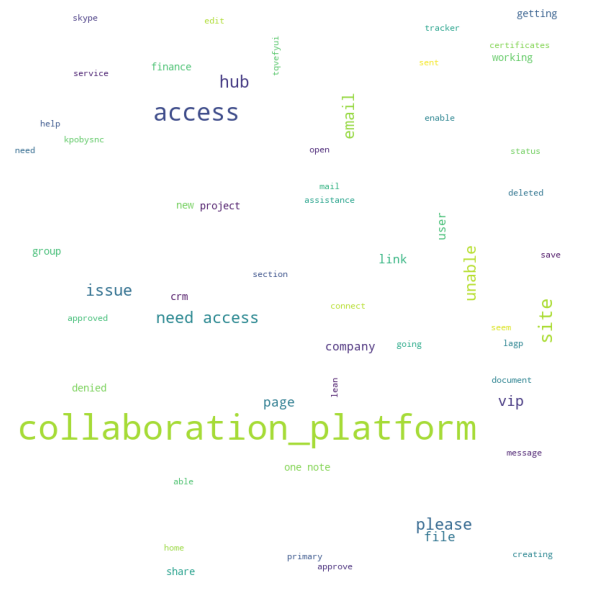

In [94]:
word_cl('GRP_16')

In [95]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,collaboration_platform,49,1.000000,GRP_16
1,access,19,0.387755,GRP_16
2,site,10,0.204082,GRP_16
3,hub,8,0.163265,GRP_16
4,please,7,0.142857,GRP_16
5,issue,7,0.142857,GRP_16
6,email,7,0.142857,GRP_16
7,unable,7,0.142857,GRP_16
8,need access,7,0.142857,GRP_16
9,vip,6,0.122449,GRP_16


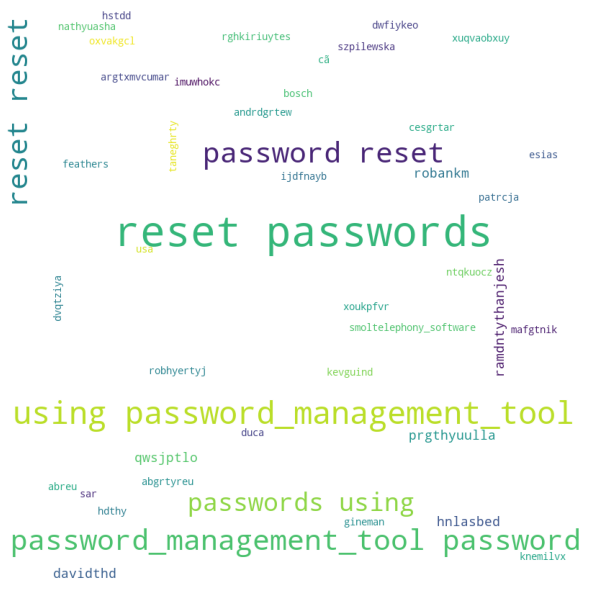

In [96]:
word_cl('GRP_17')

In [97]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,reset passwords,81,1.000000,GRP_17
1,using password_management_tool,81,1.000000,GRP_17
2,password_management_tool password,81,1.000000,GRP_17
3,password reset,81,1.000000,GRP_17
4,reset reset,80,0.987654,GRP_17
5,passwords using,59,0.728395,GRP_17
6,qwsjptlo,2,0.024691,GRP_17
7,hnlasbed,2,0.024691,GRP_17
8,davidthd,2,0.024691,GRP_17
9,robankm,2,0.024691,GRP_17


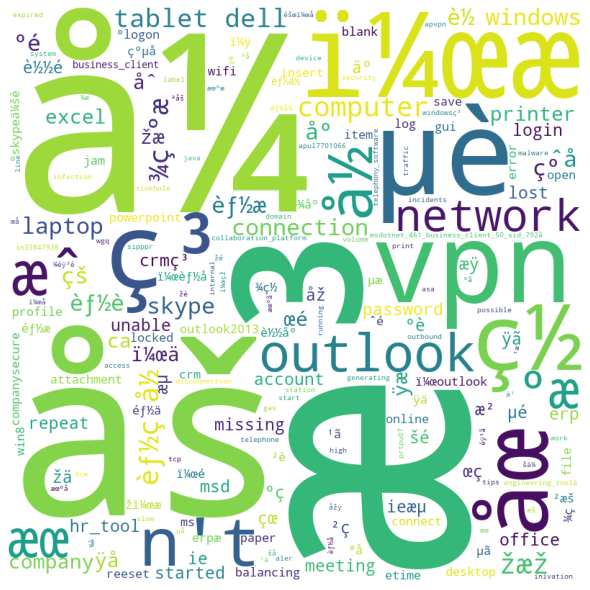

In [98]:
word_cl('GRP_31')

In [99]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,æ³,15,1.000000,GRP_31
1,å¼,12,0.800000,GRP_31
2,åš,11,0.733333,GRP_31
3,ï¼œæ,8,0.533333,GRP_31
4,µè,8,0.533333,GRP_31
5,vpn,7,0.466667,GRP_31
6,ç³,7,0.466667,GRP_31
7,ç½,6,0.400000,GRP_31
8,åœ,6,0.400000,GRP_31
9,n't,6,0.400000,GRP_31


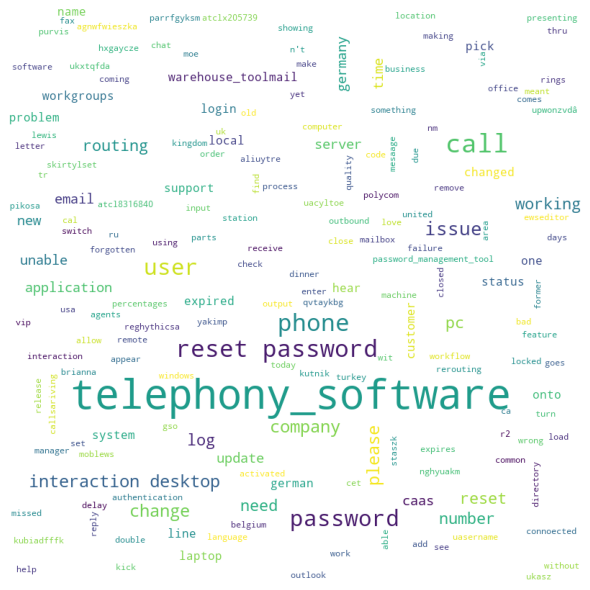

In [100]:
word_cl('GRP_7')

In [101]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,telephony_software,44,1.000000,GRP_7
1,call,12,0.272727,GRP_7
2,phone,10,0.227273,GRP_7
3,reset password,10,0.227273,GRP_7
4,user,9,0.204545,GRP_7
5,password,9,0.204545,GRP_7
6,issue,6,0.136364,GRP_7
7,change,5,0.113636,GRP_7
8,please,5,0.113636,GRP_7
9,company,5,0.113636,GRP_7


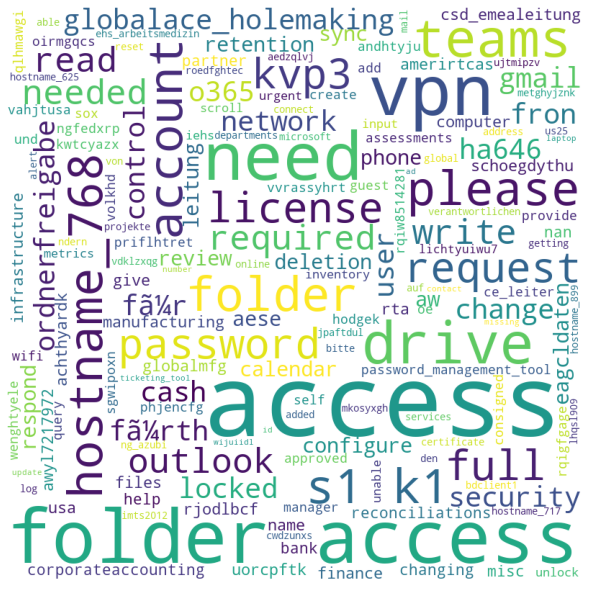

In [102]:
word_cl('GRP_34')

In [103]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,access,19,1.000000,GRP_34
1,folder access,10,0.526316,GRP_34
2,vpn,9,0.473684,GRP_34
3,need,8,0.421053,GRP_34
4,drive,6,0.315789,GRP_34
5,teams,5,0.263158,GRP_34
6,folder,4,0.210526,GRP_34
7,please,4,0.210526,GRP_34
8,hostname_768,4,0.210526,GRP_34
9,account,4,0.210526,GRP_34


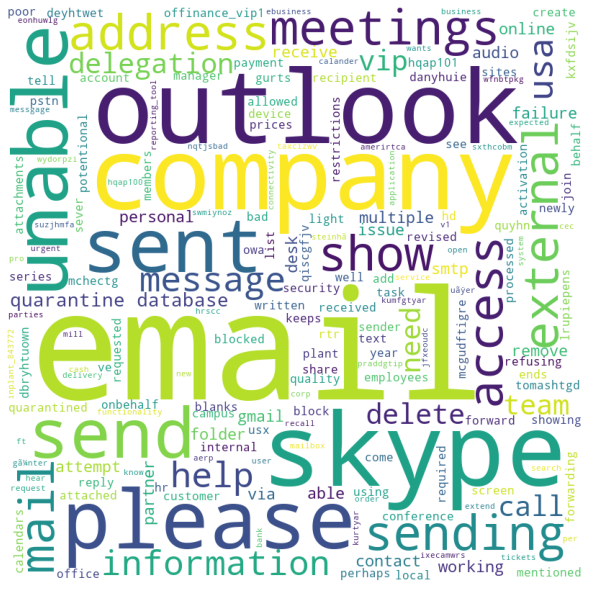

In [104]:
word_cl('GRP_26')

In [105]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,email,24,1.000000,GRP_26
1,outlook,8,0.333333,GRP_26
2,company,8,0.333333,GRP_26
3,skype,8,0.333333,GRP_26
4,please,7,0.291667,GRP_26
5,sent,6,0.250000,GRP_26
6,unable,6,0.250000,GRP_26
7,send,5,0.208333,GRP_26
8,meetings,4,0.166667,GRP_26
9,show,4,0.166667,GRP_26


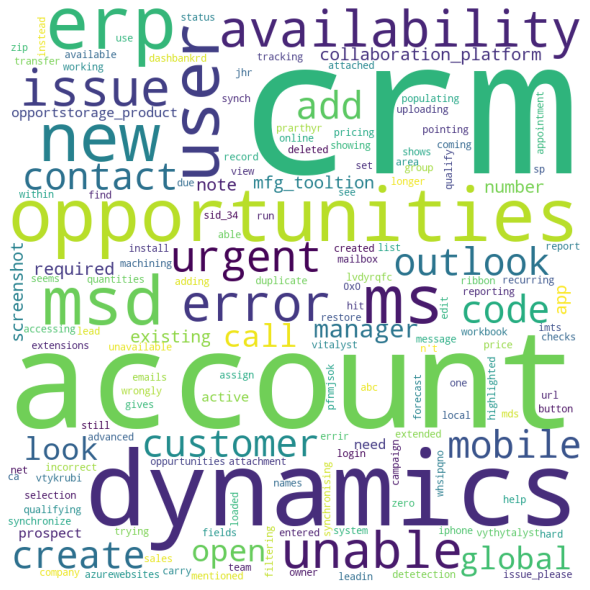

In [106]:
word_cl('GRP_40')

In [107]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,crm,31,1.000000,GRP_40
1,account,15,0.483871,GRP_40
2,dynamics,8,0.258065,GRP_40
3,opportunities,6,0.193548,GRP_40
4,erp,6,0.193548,GRP_40
5,ms,5,0.161290,GRP_40
6,user,5,0.161290,GRP_40
7,msd,5,0.161290,GRP_40
8,new,5,0.161290,GRP_40
9,availability,4,0.129032,GRP_40


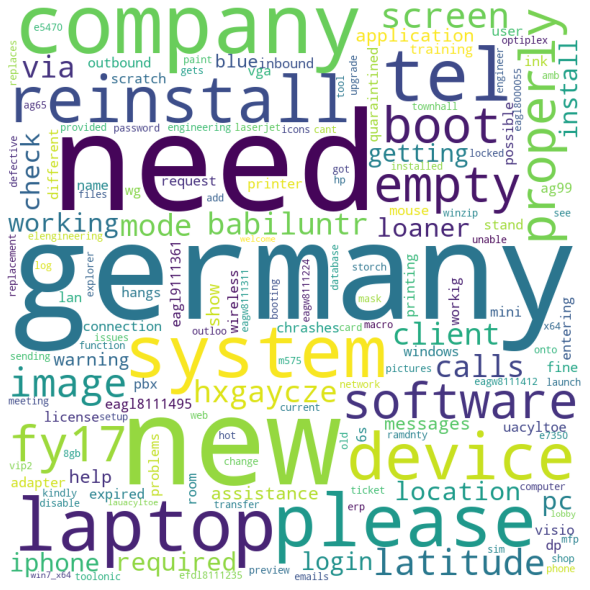

In [108]:
word_cl('GRP_28')

In [109]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,germany,5,1.0,GRP_28
1,need,5,1.0,GRP_28
2,new,4,0.8,GRP_28
3,company,4,0.8,GRP_28
4,tel,3,0.6,GRP_28
5,system,3,0.6,GRP_28
6,please,3,0.6,GRP_28
7,laptop,3,0.6,GRP_28
8,reinstall,3,0.6,GRP_28
9,device,3,0.6,GRP_28


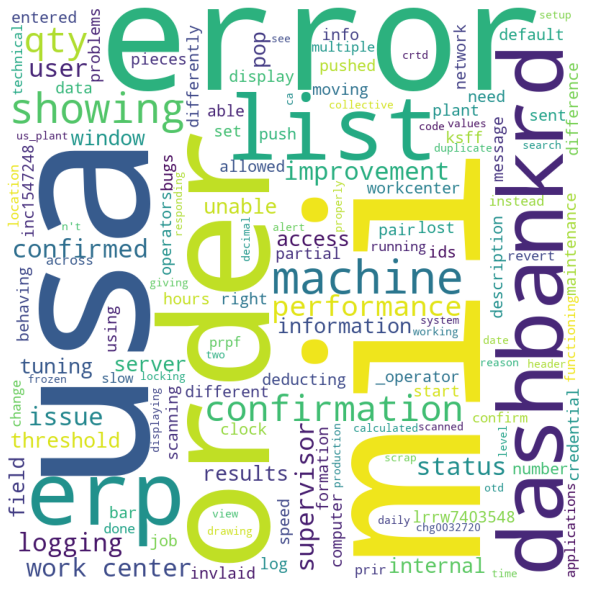

In [110]:
word_cl('GRP_41')

In [111]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,mii,13,1.000000,GRP_41
1,usa,9,0.692308,GRP_41
2,error,7,0.538462,GRP_41
3,order,7,0.538462,GRP_41
4,erp,5,0.384615,GRP_41
5,dashbankrd,5,0.384615,GRP_41
6,list,5,0.384615,GRP_41
7,machine,5,0.384615,GRP_41
8,showing,4,0.307692,GRP_41
9,confirmation,4,0.307692,GRP_41


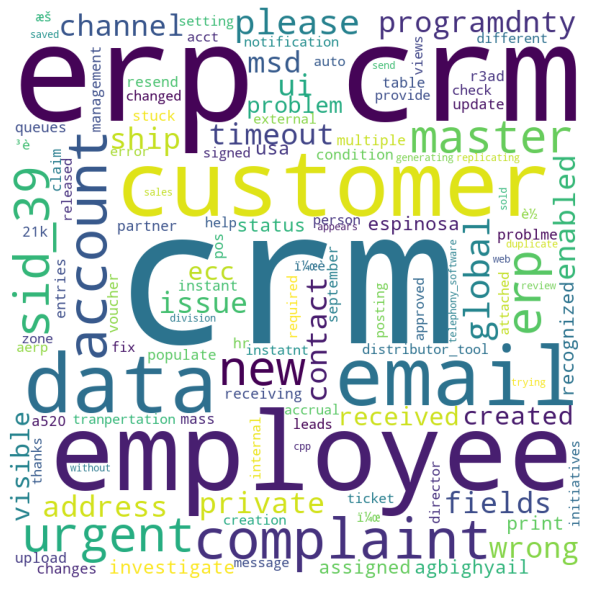

In [112]:
word_cl('GRP_15')

In [113]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,crm,16,1.0000,GRP_15
1,erp crm,10,0.6250,GRP_15
2,employee,6,0.3750,GRP_15
3,customer,5,0.3125,GRP_15
4,email,4,0.2500,GRP_15
5,data,4,0.2500,GRP_15
6,complaint,4,0.2500,GRP_15
7,account,4,0.2500,GRP_15
8,erp,3,0.1875,GRP_15
9,urgent,3,0.1875,GRP_15


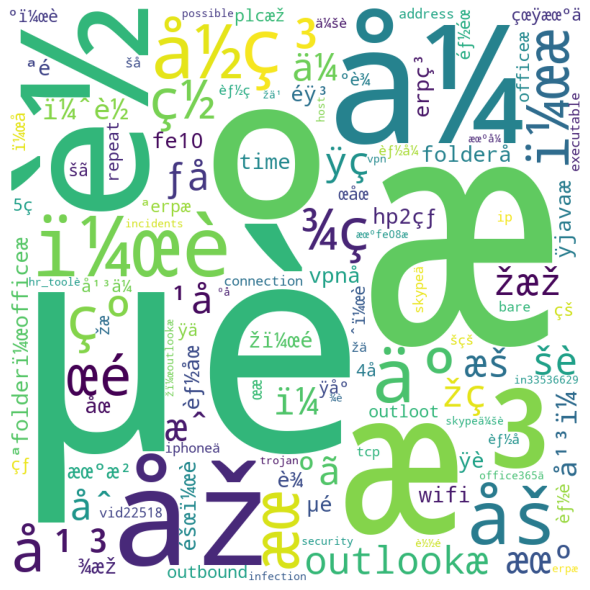

In [114]:
word_cl('GRP_30')

In [115]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,ºæ,12,1.000000,GRP_30
1,µè,10,0.833333,GRP_30
2,æ³,9,0.750000,GRP_30
3,è½,7,0.583333,GRP_30
4,å¼,6,0.500000,GRP_30
5,åž,5,0.416667,GRP_30
6,ï¼œè,5,0.416667,GRP_30
7,ç³,4,0.333333,GRP_30
8,åš,4,0.333333,GRP_30
9,å½,4,0.333333,GRP_30


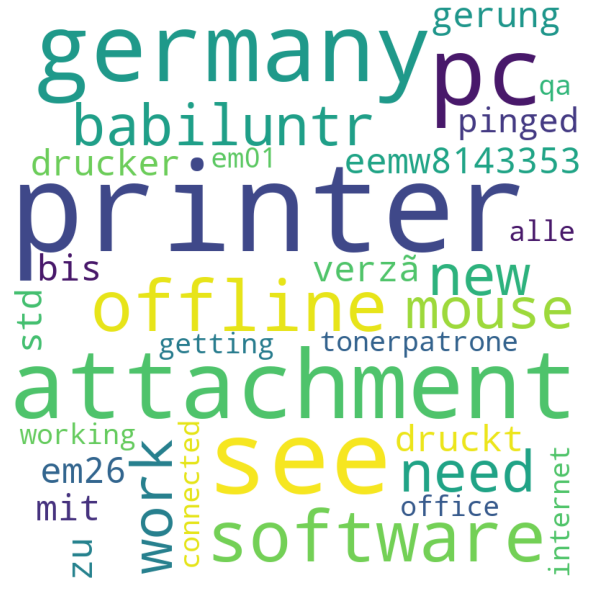

In [116]:
word_cl('GRP_42')

In [117]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,printer,3,1.000000,GRP_42
1,see,2,0.666667,GRP_42
2,attachment,2,0.666667,GRP_42
3,pc,2,0.666667,GRP_42
4,germany,2,0.666667,GRP_42
5,offline,1,0.333333,GRP_42
6,software,1,0.333333,GRP_42
7,babiluntr,1,0.333333,GRP_42
8,work,1,0.333333,GRP_42
9,need,1,0.333333,GRP_42


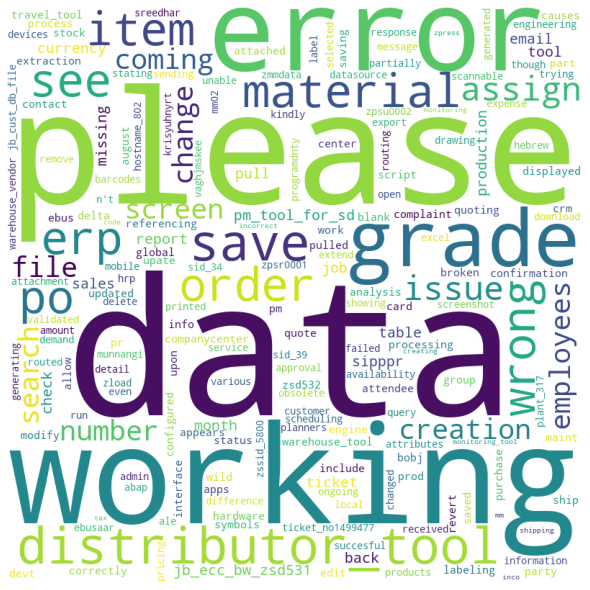

In [118]:
word_cl('GRP_20')

In [119]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,data,5,1.0,GRP_20
1,please,5,1.0,GRP_20
2,working,4,0.8,GRP_20
3,error,4,0.8,GRP_20
4,grade,3,0.6,GRP_20
5,distributor_tool,3,0.6,GRP_20
6,save,3,0.6,GRP_20
7,material,3,0.6,GRP_20
8,item,3,0.6,GRP_20
9,wrong,3,0.6,GRP_20


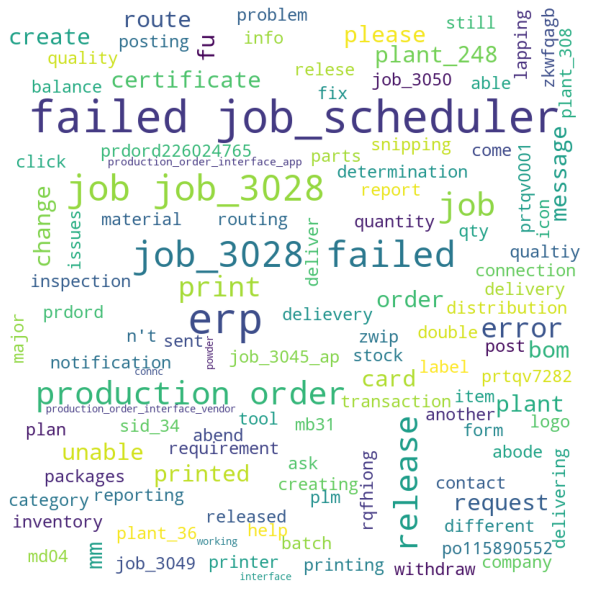

In [120]:
word_cl('GRP_45')

In [121]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,failed job_scheduler,8,1.000,GRP_45
1,erp,7,0.875,GRP_45
2,job job_3028,5,0.625,GRP_45
3,job_3028 failed,5,0.625,GRP_45
4,release,4,0.500,GRP_45
5,job,4,0.500,GRP_45
6,production order,4,0.500,GRP_45
7,print,3,0.375,GRP_45
8,error,3,0.375,GRP_45
9,create,2,0.250,GRP_45


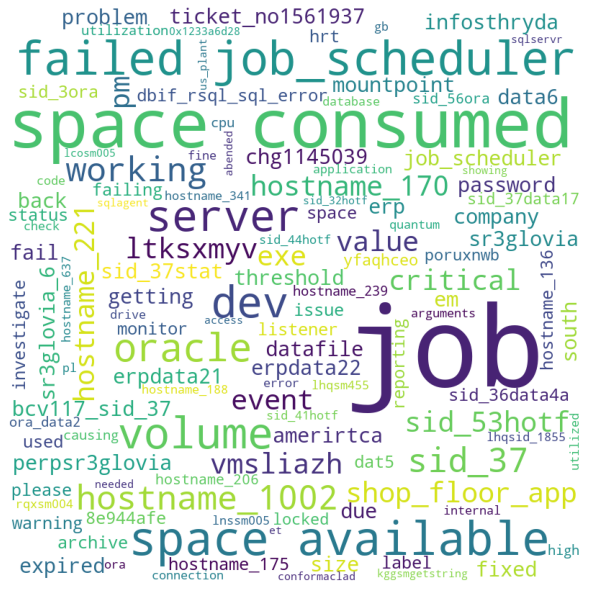

In [122]:
word_cl('GRP_1')

In [123]:
freq_data.head(10)

,Words,Freq,Freq_Pct,Group
0,job,9,1.000000,GRP_1
1,space consumed,7,0.777778,GRP_1
2,failed job_scheduler,6,0.666667,GRP_1
3,space available,6,0.666667,GRP_1
4,dev,5,0.555556,GRP_1
5,volume,5,0.555556,GRP_1
6,server,5,0.555556,GRP_1
7,oracle,4,0.444444,GRP_1
8,sid_37,3,0.333333,GRP_1
9,working,3,0.333333,GRP_1


In [144]:
data_dup1= dev_data[dev_data.duplicated(subset=['Description1', 'Short_description1'],keep=False)]
data_dup2=data_dup1.sort_values(by=['Description1', 'Short_description1'])
data_dup2.shape

(1044, 4)

In [145]:
data_dup3=data_dup2.drop_duplicates(subset=['Description1', 'Short_description1','Assignment_group'])
data_dup3.shape

(265, 4)

In [148]:
data_dup4=data_dup3[data_dup3.duplicated(subset=['Description1', 'Short_description1'],keep=False)]
data_dup4.shape

(60, 4)

In [149]:
data_dup5=data_dup4.sort_values(by=['Description1', 'Short_description1','Assignment_group'])

In [150]:
from google.colab import files

data_dup5.to_csv('data_dup_diffgrp.csv', encoding = 'utf-8-sig') 
files.download('data_dup_diffgrp.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>